# Data and Model

In [1]:
import os
import h5py
import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt
# from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
# from scipy import ndimage
from scipy import ndimage
from sklearn import metrics
from sklearn import linear_model
# from skimage import exposure

# Tensorflow/Keras
import tensorflow as tf
print(tf.__version__)
from tensorflow import keras
print(keras.__version__)
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import layers
from tensorflow.keras import regularizers
from keras.utils import to_categorical

# Own functions
from functions.plot_slices import plot_slices
from functions.ontram import ontram
from functions.plot_results import plot_results
from functions.methods import predict


2.2.0
2.3.0-tf


Using TensorFlow backend.


In [2]:
!nvidia-smi

Thu Jul 15 13:48:08 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.80       Driver Version: 460.80       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  TITAN RTX           Off  | 00000000:B3:00.0 Off |                  N/A |
| 40%   31C    P2    51W / 280W |    171MiB / 24220MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
def img_model(input_shape, output_shape, input_name, activation = "linear"):
    
    initializer = keras.initializers.he_normal(seed = 2802)
    
    in_ = keras.Input(shape = input_shape, name = input_name)
    x = layers.Convolution3D(32, kernel_size=(3, 3, 3), padding = 'same', activation = 'relu', kernel_initializer = initializer)(in_)
    x = layers.BatchNormalization(center=True, scale=True)(x)
    x = layers.MaxPooling3D(pool_size=(2, 2, 2), padding="same")(x) # evtl (2,2,2)
    
    x = layers.Convolution3D(32, kernel_size=(3, 3, 3), padding = 'same', activation = 'relu', kernel_initializer = initializer)(x)
    x = layers.BatchNormalization(center=True, scale=True)(x)
    x = layers.MaxPooling3D(pool_size=(2, 2, 2), padding="same")(x)
    
    x = layers.Convolution3D(64, kernel_size=(3, 3, 3), padding = 'same', activation = 'relu', kernel_initializer = initializer)(x)
    x = layers.BatchNormalization(center=True, scale=True)(x)
    x = layers.MaxPooling3D(pool_size=(2, 2, 2), padding="same")(x)
    
    x = layers.Convolution3D(64, kernel_size=(3, 3, 3), padding = 'same', activation = 'relu', kernel_initializer = initializer)(x)
    x = layers.BatchNormalization(center=True, scale=True)(x)
    x = layers.MaxPooling3D(pool_size=(2, 2, 2), padding="same")(x)
    
    x = layers.Convolution3D(128, kernel_size=(3, 3, 3), padding = 'same', activation = 'relu', kernel_initializer = initializer)(x)
    x = layers.BatchNormalization(center=True, scale=True)(x)
    x = layers.MaxPooling3D(pool_size=(2, 2, 2), padding="same")(x)
    
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation = 'relu', kernel_initializer = initializer)(x)
    x = layers.BatchNormalization(center=True, scale=True)(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation = 'relu', kernel_initializer = initializer)(x)
    x = layers.BatchNormalization(center=True, scale=True)(x)
    x = layers.Dropout(0.3)(x)
    
    h = layers.Dense(output_shape, activation = activation)(x) # activation = linear
    out_ = layers.Lambda(lambda x: x * 0.1)(h) # get rid of too large values for h
    nn_im = keras.Model(inputs = in_, outputs = out_)
    return nn_im

In [4]:
# OUTPUT_VARIABLE = "stroke"
OUTPUT_VARIABLE = "mrs"

# os.getcwd()
DIR = "/tf/notebooks/"
OUTPUT_DIR = '/tf/notebooks/avci/XAI/mrs_prediction_3D_dicom/'
INPUT_IMG = "/tf/notebooks/data/dicom_3d_128x128x30.h5"
INPUT_TAB = "/tf/notebooks/avci/XAI/data/patient_data_DWI_Zurich_imputed.csv"

In [5]:
def decode_data(string):
    decoded_string = [n.decode("UTF-8", "ignore") for n in string]
    return(decoded_string)

In [6]:
with h5py.File(INPUT_IMG, "r") as h5:
    print(h5.keys())
    X = h5["X"][:]
    Y_pat = h5["stroke"][:]
    Y_img = h5["Y"][:]
    pat = decode_data(h5["pat"])[:]

<KeysViewHDF5 ['X', 'Y', 'pat', 'path', 'stroke']>


In [7]:
def standardize(array):
    mean = np.mean(array)
    sd = np.std(array)
    standardized = (array - mean) / sd
    return standardized

In [8]:
X = np.array([standardize(x) for x in X])

In [9]:
X = np.expand_dims(X, axis = 4)

In [10]:
dat = pd.read_csv(INPUT_TAB, sep = ',')


In [11]:
# change values to numbers
dat = dat.replace('no', 0)
dat = dat.replace('yes', 1)
dat.sex = dat.sex.replace('female', 1)
dat.sex = dat.sex.replace('male', 0)
# standardize age
# dat.age = (dat.age - np.mean(dat.age))/np.std(dat.age)
dat.p_id =[format(id, '03d') for id in dat.p_id]
dat.head(3)

,p_id,age,sex,mrs_before,nihss_baseline,ivt,iat,stroke_before,tia_before,ich_before,...,rf_smoker,rf_atrial_fibrillation,rf_chd,heart_valve,reduced_pumping_fct,peripheral_occlusion,event,mrs_3months,nihss_24h,nihss_3months
0,001,34.0,0,0,1,0,0,0,0,0,...,0,0,0,b,n,n,Stroke,1.0,0.0,0.0
1,002,46.0,0,0,8,1,1,0,0,0,...,0,0,0,n,n,n,Stroke,1.0,12.0,0.0
2,003,81.0,0,0,16,1,0,0,0,0,...,1,1,0,n,n,n,Stroke,0.0,5.0,NaN


In [12]:
print("number of missing outcomes: {}".format(sum(dat.mrs_3months.isna())))
missing_ids = dat.p_id[dat.mrs_3months.isna()]

number of missing outcomes: 29


In [13]:
#remove all patients with missing outcome
keeps = [not i for i in dat.mrs_3months.isna()]
dat = dat[keeps]
sum(dat.mrs_3months.isna())

0

In [14]:
# remove images with missing outcomes
print(X.shape)
for id in missing_ids:
    X = np.delete(X, np.where(np.array(pat) == id)[0][0], axis = 0)
    Y_pat = np.delete(Y_pat, np.where(np.array(pat) == id)[0][0], axis = 0)
    pat = np.delete(pat, np.where(np.array(pat) == id)[0][0], axis = 0)
print(X.shape, Y_pat.shape, pat.shape)

(497, 128, 128, 30, 1)
(468, 128, 128, 30, 1) (468,) (468,)


(array([381.,  87.]), array([0. , 0.5, 1. ]), <a list of 2 Patch objects>)

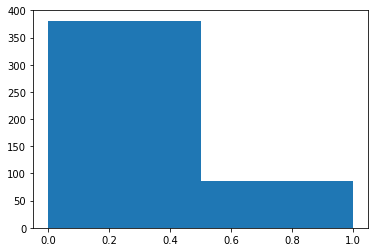

In [15]:
# define mRS binary 
dat["mrs_3months_binary"] = 1
dat.loc[dat.mrs_3months <= 2, "mrs_3months_binary"] = 0
plt.hist(dat.mrs_3months_binary, bins = 2)

In [16]:
# match tabular data to image data
# standardize age to 0 mean 1 variance
X_tab = np.zeros((X.shape[0], 12))
Y_mrs = np.zeros((X.shape[0]))
for i, p in enumerate(pat):
    k = np.where(dat.p_id.values == p)[0][0]
    dat_tmp = dat.iloc[k]
    X_tab[i,:] = np.array([dat_tmp.age, dat_tmp.sex, dat_tmp.mrs_before, dat_tmp.nihss_baseline, 
                           dat_tmp.stroke_before, dat_tmp.tia_before, dat_tmp.rf_hypertonia, 
                           dat_tmp.rf_diabetes, dat_tmp.rf_hypercholesterolemia, dat_tmp.rf_smoker, 
                           dat_tmp.rf_atrial_fibrillation, dat_tmp.rf_chd])
    Y_mrs[i] = dat_tmp.mrs_3months_binary

In [17]:
if OUTPUT_VARIABLE == "stroke":
    Y = Y_pat
elif OUTPUT_VARIABLE == "mrs":
    Y = Y_mrs
else:
    raise ValueError("unknown OUTPUT_VARIABLE: {}".format(OUTPUT_VARIABLE))

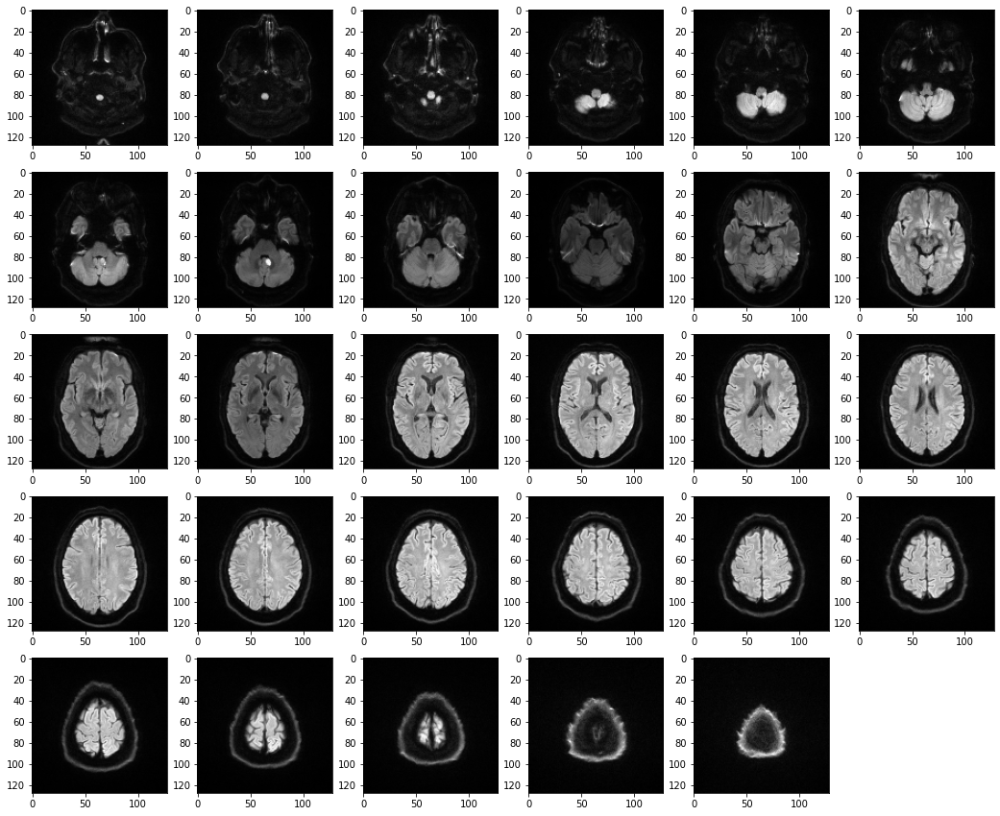

In [18]:
j = 17
plot_slices(X[j], pat, "axial", modality = "DWI") # 18 axial 

In [19]:
Y = to_categorical(Y)
print(Y.shape[1]-1)

1


In [20]:
#model = img_model(, input_name, activation = "linear")
input_shape = (128, 128, 30, 1)
output_shape = 1
nn_bl = img_model(input_shape, output_shape, "bl_in", "linear") # 1 = stroke_binary
nn_bl.load_weights('/tf/notebooks/avci/XAI/model-193.hdf5')

ci = ontram(nn_bl = nn_bl, response_varying = True)

In [21]:
predict(ci, bl = X[250:251], y = Y[250:251])['response'][0]

1

# 3d Gradcam

In [22]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
import os
import datetime
import numpy as np
import pandas as pd
from tensorflow.keras.optimizers import Adam
import cv2

In [23]:
nn_bl.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bl_in (InputLayer)           [(None, 128, 128, 30, 1)] 0         
_________________________________________________________________
conv3d (Conv3D)              (None, 128, 128, 30, 32)  896       
_________________________________________________________________
batch_normalization (BatchNo (None, 128, 128, 30, 32)  128       
_________________________________________________________________
max_pooling3d (MaxPooling3D) (None, 64, 64, 15, 32)    0         
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 64, 64, 15, 32)    27680     
_________________________________________________________________
batch_normalization_1 (Batch (None, 64, 64, 15, 32)    128       
_________________________________________________________________
max_pooling3d_1 (MaxPooling3 (None, 32, 32, 8, 32)     0     

In [24]:
io_img = X[16:17]

###---lAYER-Name--to-visualize--###
LAYER_NAME='batch_normalization_4'
LAYER_NAME = 'conv3d_4'
# Create a graph that outputs target convolution and output
grad_model = tf.keras.models.Model([nn_bl.inputs], [nn_bl.get_layer(LAYER_NAME).output, nn_bl.output])
#grad_model.summary()

In [25]:
from skimage.transform import resize
from matplotlib import pyplot as plt
from skimage.transform import resize

###----index of the class
#CLASS_INDEX=1

###--Compute GRADIENT
with tf.GradientTape() as tape:
    conv_outputs, predictions = grad_model(io_img)    
    loss = predictions[0][0]
    

# Extract filters and gradients
output = conv_outputs[0]
grads = tape.gradient(loss, conv_outputs)[0]

# Average gradients spatially
weights = tf.reduce_mean(grads, axis=(0, 1,2))

# Build a ponderated map of filters according to gradients importance
cam = np.zeros(output.shape[0:3], dtype=np.float32)

for index, w in enumerate(weights):
    cam += w * output[:, :, :, index]
    
capi=resize(cam,(128,128,30))

capi = np.maximum(capi,0)
heatmap = (capi - capi.min()) / (capi.max() - capi.min())
resized_img = io_img.reshape(128, 128, 30)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.


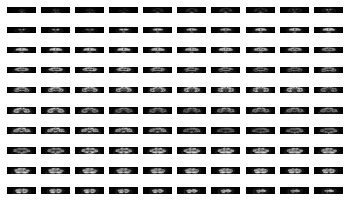

In [26]:
im = X[216:217,:,: ].reshape(128,128,30)
for ax_slice in range(10,110):
    fig = plt.subplot(11,10,ax_slice+1)
    fig.imshow(np.rot90(im[:,ax_slice,:]), cmap='gray')
    #fig.set_title(str(ax_slice))
    fig.axis('off')
    
im = X[216:217,:,: ].reshape(128,128,30)
for ax_slice in range(10,110):
    fig = plt.subplot(11,10,ax_slice+1)
    fig.imshow(np.rot90(im[ax_slice,:,:]), cmap='gray')
    fig.axis('off')

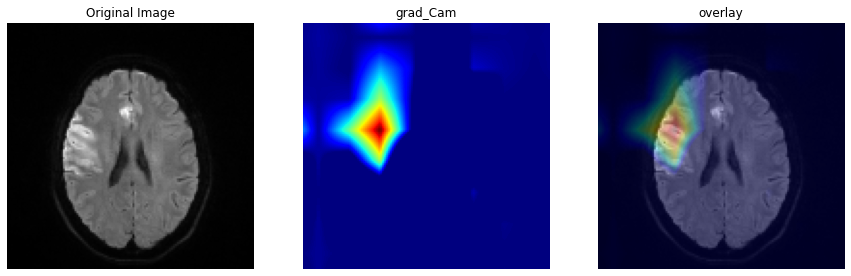

In [27]:
ax_slice = 18
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.title("Original Image");plt.axis('off')
plt.imshow(resized_img[:,:,ax_slice ], cmap="gray")

plt.subplot(1,3,2)
plt.title("grad_Cam");plt.axis('off')
plt.imshow(heatmap[:,:,ax_slice], cmap="jet")
plt.subplot(1,3,3)

plt.title("overlay");plt.axis('off')
plt.imshow(resized_img[:,:,ax_slice ] , cmap = "gray")
plt.imshow(heatmap[:,:,ax_slice], alpha=0.3,cmap="jet")
plt.show()

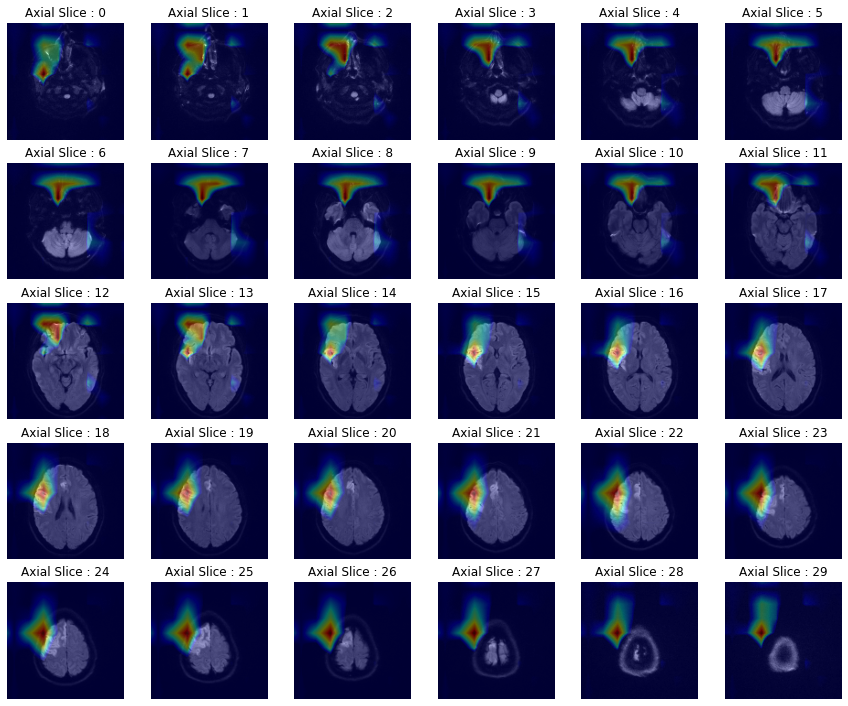

In [28]:
plt.figure(figsize=(15,15))
for ax_slice in range(30):
    fig = plt.subplot(6,6,ax_slice+1)
    fig.imshow(resized_img[:,:,ax_slice ], cmap='gray')
    fig.imshow(heatmap[:,:,ax_slice], alpha=0.4,cmap="jet")
    fig.set_title("Axial Slice : "+ str(ax_slice))
    fig.axis('off')


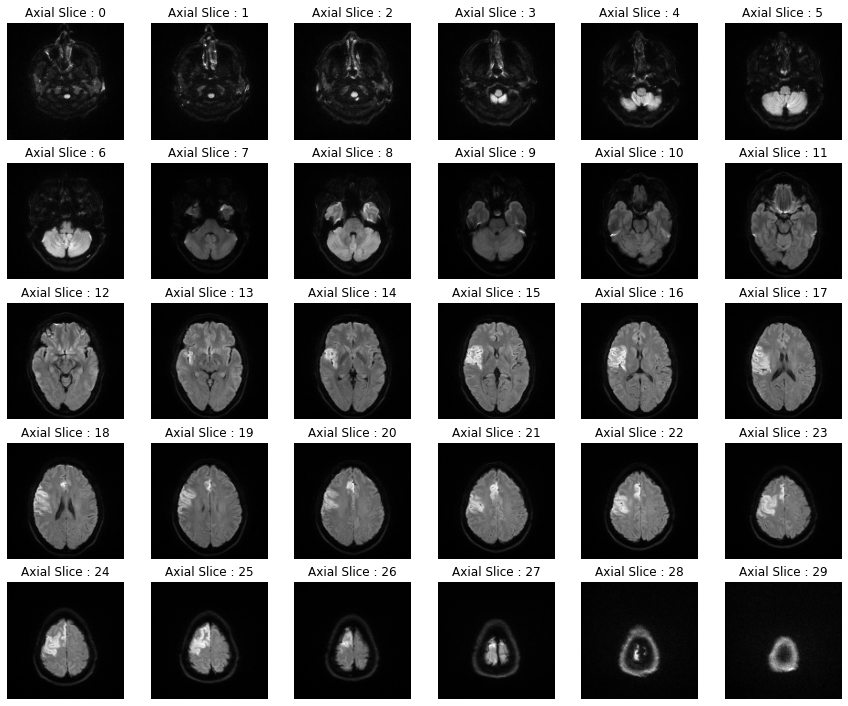

In [29]:
plt.figure(figsize=(15,15))
for ax_slice in range(30):
    fig = plt.subplot(6,6,ax_slice+1)
    fig.imshow(resized_img[:,:,ax_slice ], cmap='gray')
    fig.set_title("Axial Slice : "+ str(ax_slice))
    fig.axis('off')


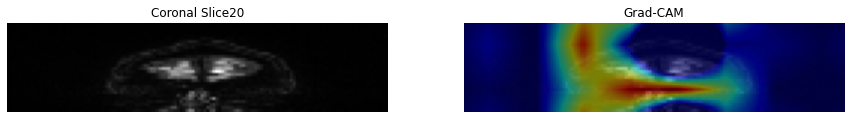

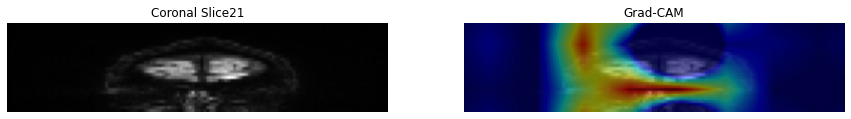

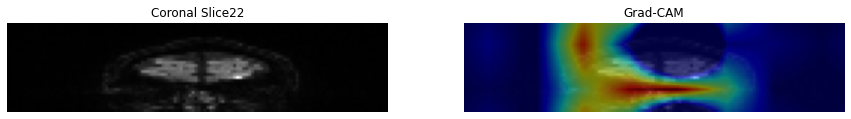

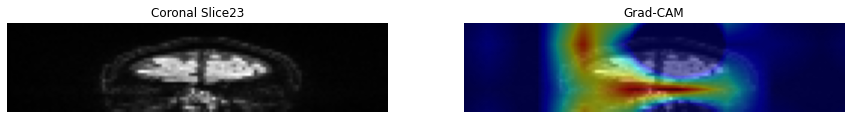

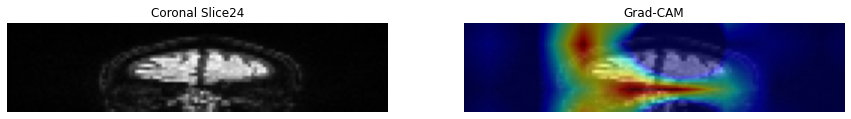

...

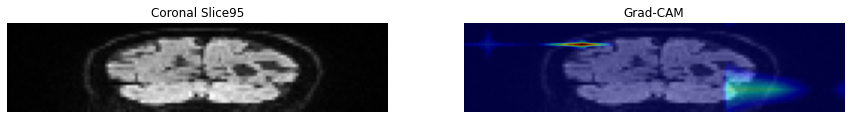

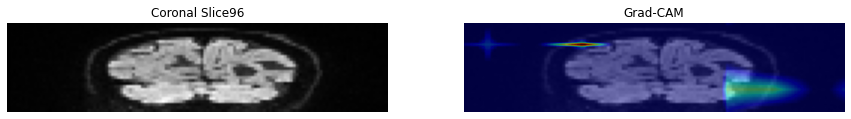

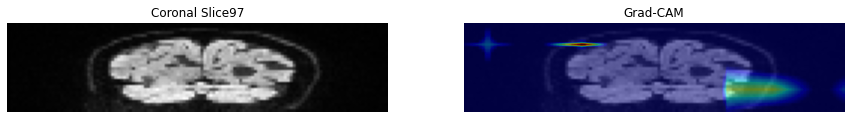

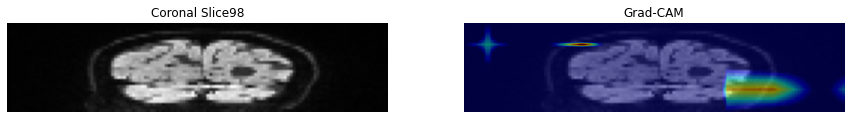

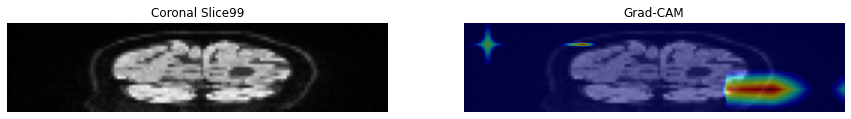

In [30]:
im = X[216:217,:,: ].reshape(128,128,30)
for ax_slice in range(20,100):
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.title("Coronal Slice"+str(ax_slice));plt.axis('off')
    plt.imshow(np.rot90(im[ax_slice,:,:]), cmap="gray")
    
    plt.subplot(1,2,2)
    plt.title("Grad-CAM");plt.axis('off')
    plt.imshow(np.rot90(im[ax_slice,:,:]) , cmap = "gray")
    plt.imshow(np.rot90(heatmap[ax_slice,:,:]), alpha=0.5,cmap="jet")
    plt.show()

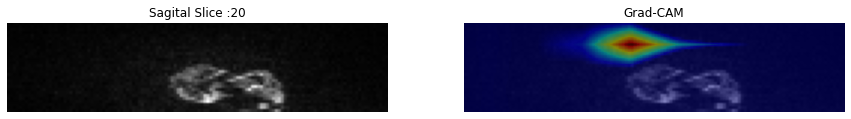

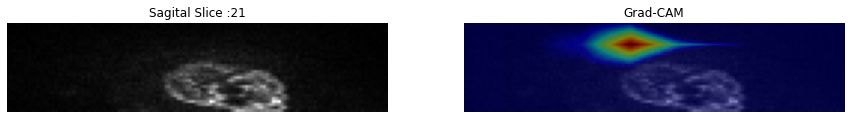

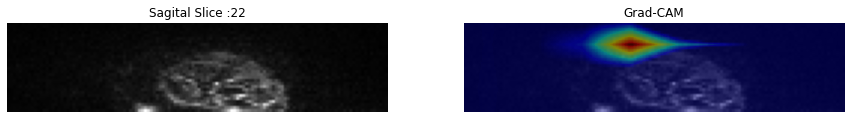

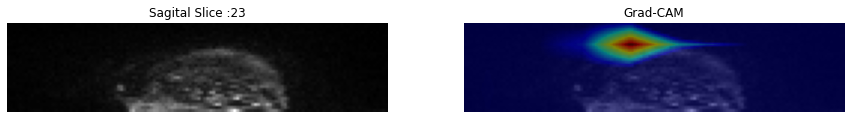

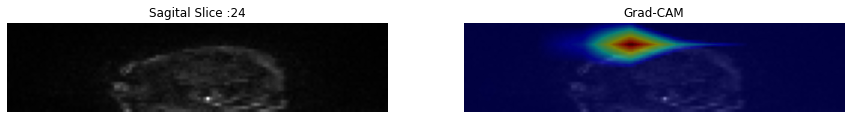

...

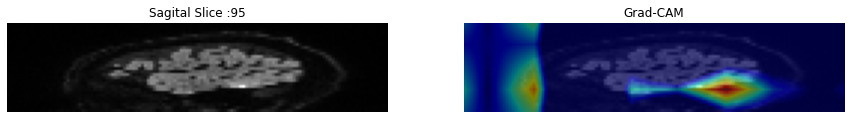

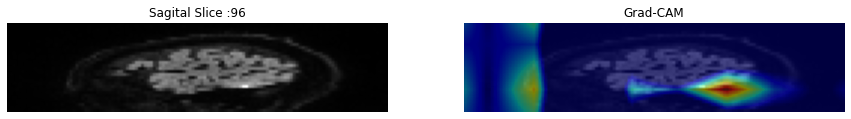

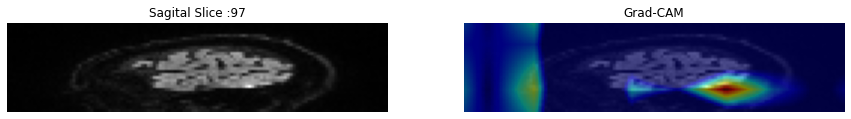

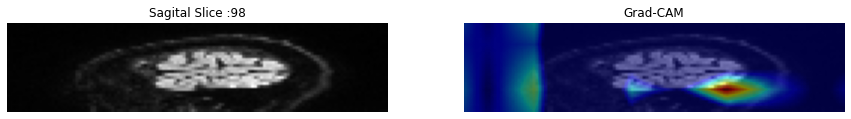

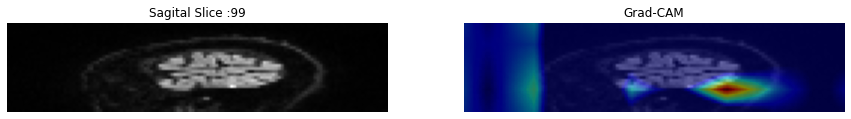

In [31]:
im = X[216:217,:,: ].reshape(128,128,30)

for ax_slice in range(20,100):
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.title("Sagital Slice :" + str(ax_slice));plt.axis('off')
    plt.imshow(np.rot90(im[:,ax_slice,:]), cmap="gray")
    plt.subplot(1,2,2)
    plt.title("Grad-CAM");plt.axis('off')
    plt.imshow(np.rot90(im[:,ax_slice,:]) , cmap = "gray")
    plt.imshow(np.rot90(heatmap[:,ax_slice,:]), alpha=0.5,cmap="jet")
    plt.show()

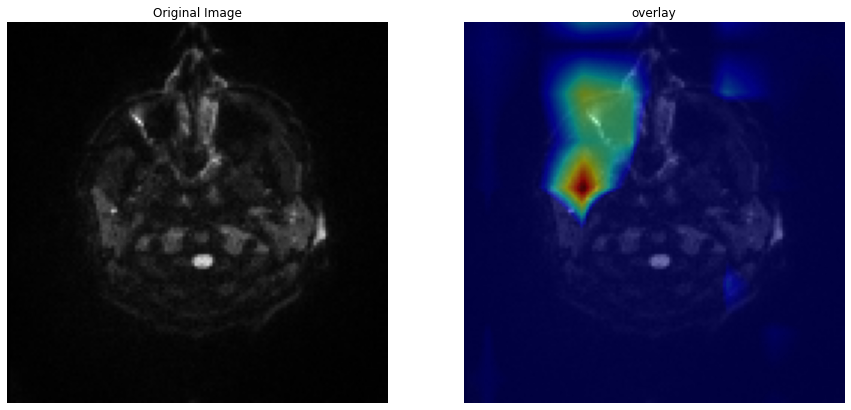

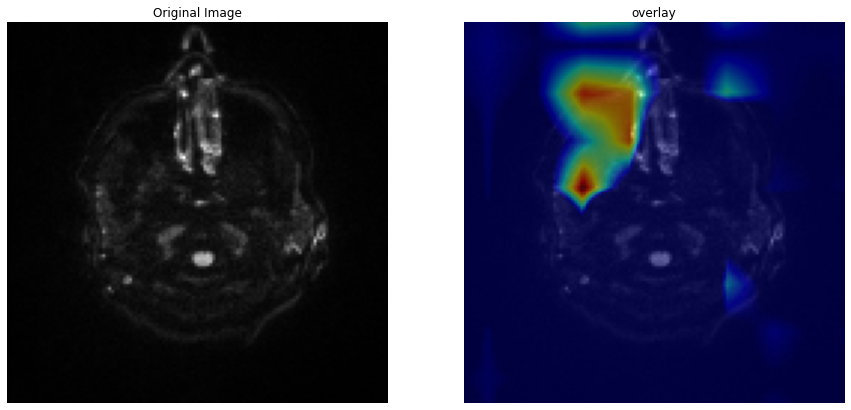

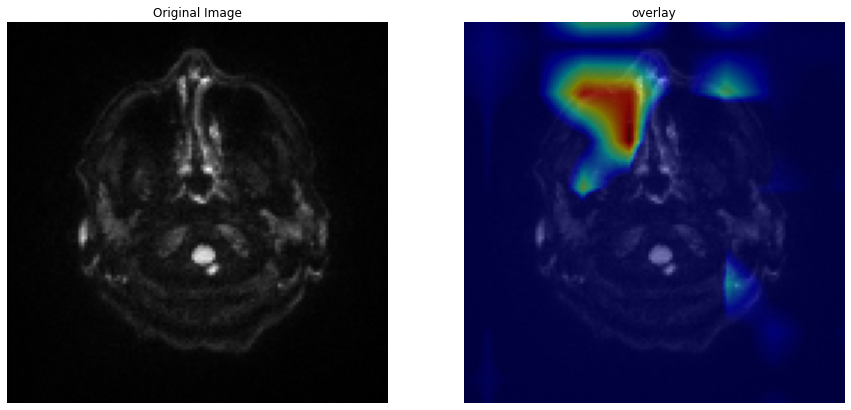

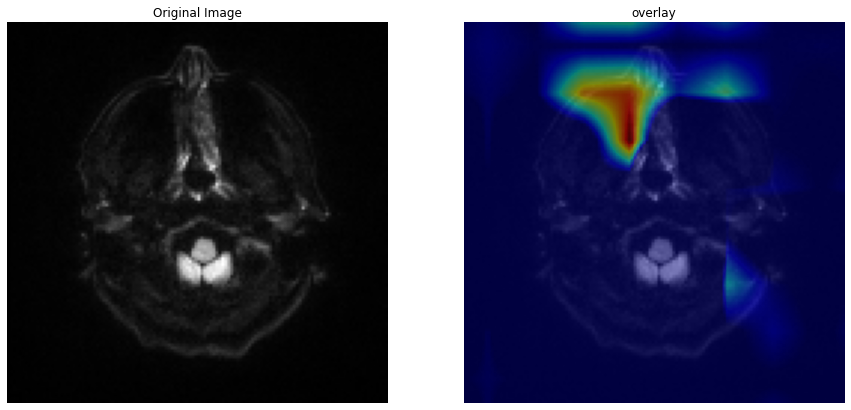

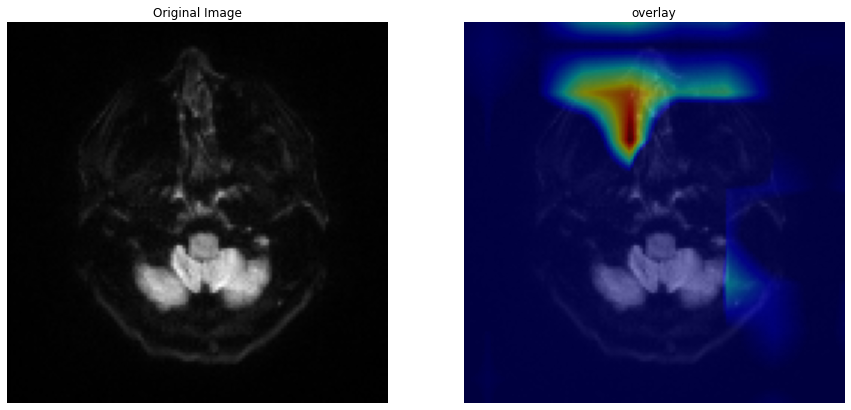

...

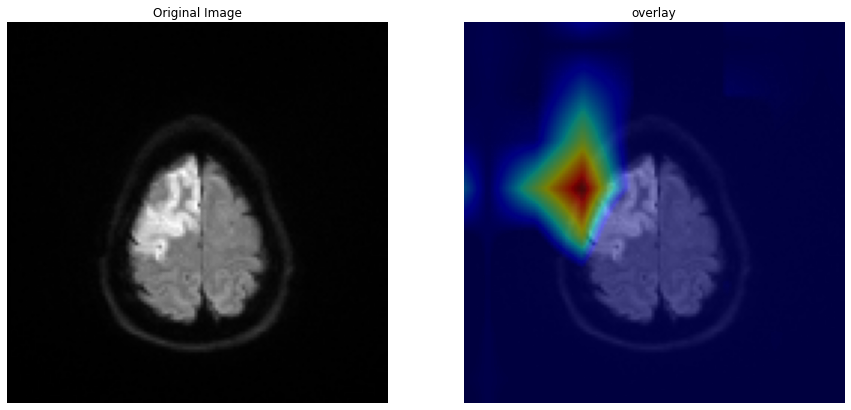

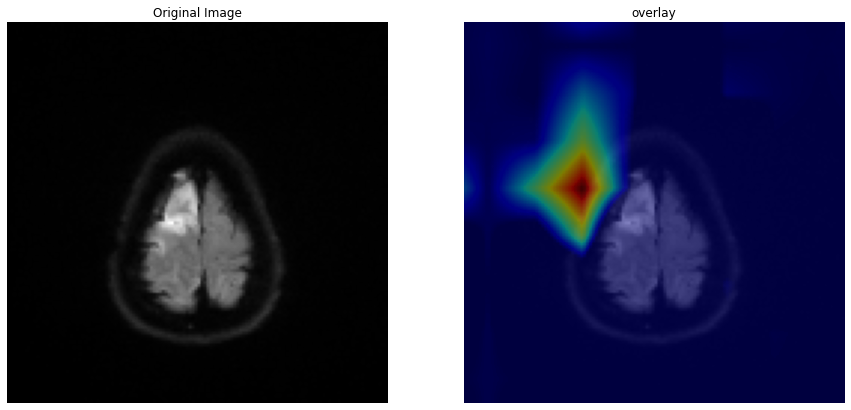

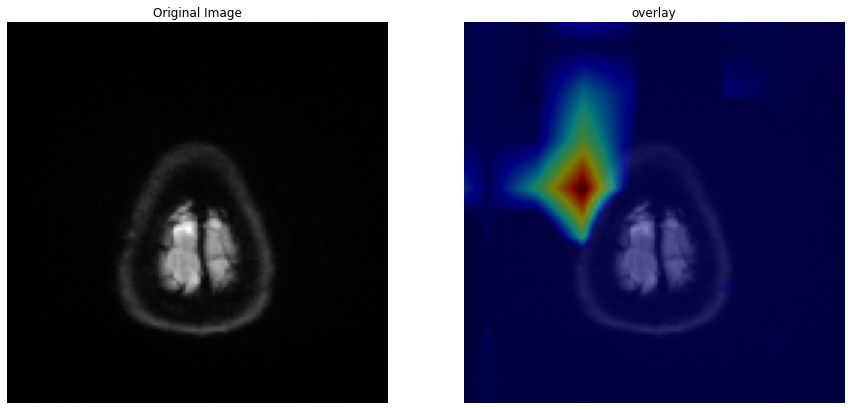

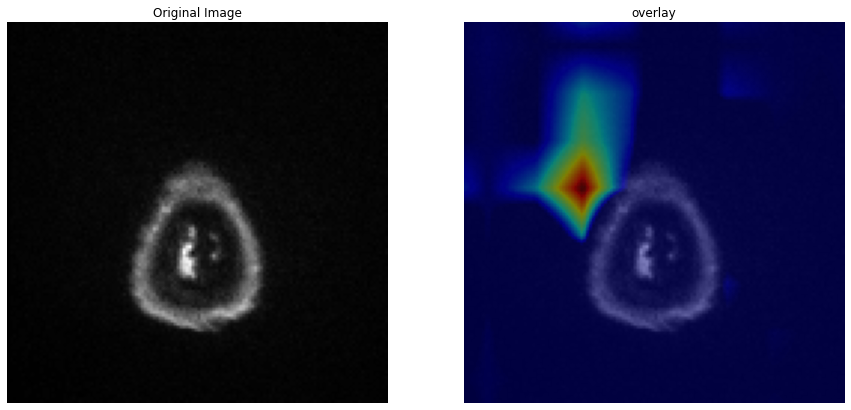

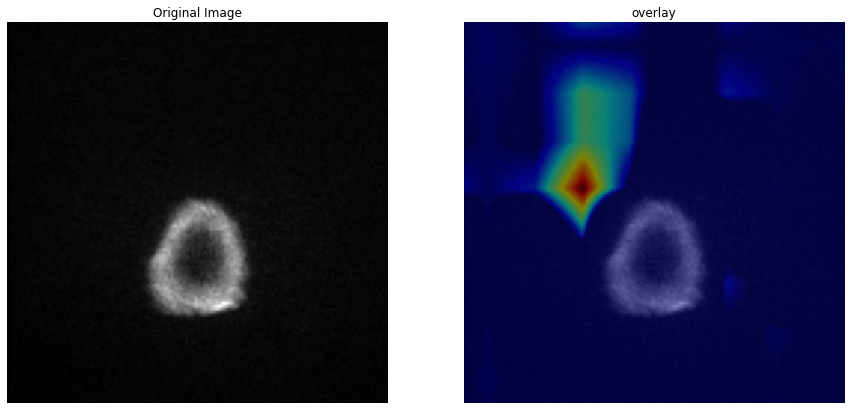

In [32]:
for ax_slice in range(30):
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.title("Original Image");plt.axis('off')
    plt.imshow(resized_img[:,:,ax_slice ], cmap="gray")
    plt.subplot(1,2,2)
    plt.title("overlay");plt.axis('off')
    plt.imshow(resized_img[:,:,ax_slice ] , cmap = "gray")
    plt.imshow(heatmap[:,:,ax_slice], alpha=0.5,cmap="jet")
    plt.show()